In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import cv2
import os
import sys
from skimage.segmentation import clear_border as ski_clear_border
sys.path.append("/home/psa_images/SemiF-AnnotationPipeline/")
sys.path.append("/home/psa_images/SemiF-AnnotationPipeline/segment")
from semif_utils.utils import (apply_mask, clear_border, make_exg, make_kmeans,reduce_holes,cutoutmeta2csv,
                               otsu_thresh, reduce_holes, thresh_vi)
from utils.utils import trans_cutout

/home/mkutuga/anaconda3/envs/semif/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Helpers

In [2]:
def filter_by_area(df, area_min, area_max):

    desc = df["area"].describe()
    if area_min == "mean":
        df = df[df["area"] > desc.iloc[1]]
    if area_max == "mean":
        df = df[df["area"] < desc.iloc[1]]
    if area_min == 25:
        df = df[df["area"] > desc.iloc[4]]
    if area_max == 25:
        df = df[df["area"] < desc.iloc[4]]
    if area_min == 50:
        df = df[df["area"] > desc.iloc[5]]
    if area_max == 50:
        df = df[df["area"] < desc.iloc[5]]
    if area_min == 75:
        df = df[df["area"] > desc.iloc[6]]
    if area_max == 75:
        df = df[df["area"] < desc.iloc[6]]
    return df


def filter_by_solidity(df, solid_min, solid_max):

    if solid_min != None:
        df = df[df["solidity"] > solid_min]

    if solid_max != None:
        df = df[df["solidity"] < solid_max]

    return df

def filter_by_num_components(df, component_min, component_max):
    if component_min != None:
        df = df[df["num_components"] > component_min]

    if component_max != None:
        df = df[df["num_components"] < component_max]
    
    return df

def preview_cutout_results(df,batch_id, number_of_samples, extends_border, is_primary,
                           green_sum_max, green_sum_min, area_min, area_max,
                        solid_min, solid_max,component_min, component_max,
                           random_sample_state, fig_save_dir):
    print("\nBatch: ", batch_id)
    print("\nTotal number of cutouts by species")
    print(df.groupby(["common_name"])["cutout_id"].nunique())
    print(len(df))

    mdf = df.copy()
    if extends_border != None:
        mdf = mdf[mdf["extends_border"] == extends_border]
    if is_primary != None:
        mdf = mdf[mdf["is_primary"] == is_primary]
    if green_sum_min != None:
        mdf = mdf[mdf["green_sum"] > green_sum_min]
    if green_sum_max != None:
        mdf = mdf[mdf["green_sum"] < green_sum_max]
    if area_min != None and area_max != None:
        mdf = filter_by_area(mdf, area_min, area_max)
    if solid_min != None and solid_max != None:
        mdf = filter_by_solidity(mdf, solid_min, solid_max)
    if component_min != None or component_max != None:
        mdf = filter_by_num_components(mdf, component_min, component_max)

    print("\nNumber of filtered cutouts by species:")
    print(
        f"random_seed {random_sample_state} | extends_border: {extends_border} | is_primary: {is_primary} \ngreen_sum_min: {green_sum_min} | green_sum_max: {green_sum_max} | area_min: {area_min} | area_max: {area_max}"
    )
    print(mdf.groupby(["common_name"])["cutout_id"].nunique())
    print(len(mdf))

    for species in mdf["common_name"].unique():
        sdf = mdf[mdf["common_name"] == species]

        if len(sdf) == 0:
            print(f"{species} None")
            continue

        print(species)
        if len(sdf) < number_of_samples:
            imgpsdf = sdf.sample(len(sdf), random_state=random_sample_state)
        else:
            imgpsdf = sdf.sample(number_of_samples,
                                 random_state=random_sample_state)

        for _, row in imgpsdf.iterrows():
            cutimgp = row["temp_path"]
            cropimgp = row["temp_path"].replace(".png", ".jpg")
            cutmaskp = row["temp_path"].replace(".png", "_mask.png")
            save_cutout_path = Path(
                f"{fig_save_dir}/{row['common_name']}/{Path(row['cutout_id'])}.png"
            )

            Path(save_cutout_path.parent).mkdir(exist_ok=True, parents=True)

            cropimg = cv2.cvtColor(cv2.imread(cropimgp, -1), cv2.COLOR_BGR2RGB)

            cutimg = cv2.cvtColor(cv2.imread(cutimgp, -1), cv2.COLOR_BGR2RGB)

            cutmask = cv2.imread(cutmaskp, -1)

            cutimg = apply_mask(cutimg, cutmask, "black")

            _, (ax1, ax2) = plt.subplots(1, 2)
            ax1.imshow(cropimg)
            ax2.imshow(cutimg)

            ax1.axis(False)
            ax2.axis(False)

            ax1.title.set_text('Color image')
            ax2.title.set_text('Original cutout')

            plt.tight_layout()
            # plt.savefig(save_cutout_path, bbox_inches="tight", transparent=True, dpi=300)
            plt.show()
            plt.close()
    return cutmask


# View cutouts

## Get batches

In [4]:
def get_immediate_subdirectories(a_dir):
    return [name for name in os.listdir(a_dir)
            if os.path.isdir(os.path.join(a_dir, name))]
pardir = "../data/semifield-cutouts/"

cutout_dirs = sorted(get_immediate_subdirectories(pardir))
cutout_csvs =  sorted([x.stem for x in Path("/home/psa_images/SemiF-AnnotationPipeline/data/semifield-cutouts").rglob("*.csv")])
cutout_csvs

['MD_2022-10-20',
 'NC_2022-10-19',
 'NC_2022-10-21',
 'NC_2022-10-24',
 'NC_2022-10-26',
 'NC_2022-10-31',
 'NC_2022-11-02',
 'NC_2022-11-04',
 'NC_2022-11-09',
 'TX_2022-11-02',
 'TX_2022-11-03',
 'TX_2022-11-09',
 'TX_2022-11-15',
 'TX_2022-11-17',
 'TX_2022-12-01',
 'TX_2022-12-06',
 'TX_2022-12-15',
 'TX_2022-12-21',
 'TX_2022-12-26',
 'TX_2023-01-10',
 'TX_2023-01-13',
 'TX_2023-01-19',
 'TX_2023-01-25',
 'TX_2023-01-26',
 'TX_2023-02-17',
 'TX_2023-02-22',
 'TX_2023-03-03',
 'TX_2023-03-15',
 'TX_2023-03-17']

## Get cutout examples

In [5]:
batch_id = 'TX_2023-03-17'
# cutout_dir = "../data/semifield-cutouts/"
cutout_dir = "/mnt/research-projects/s/screberg/longterm_images/semifield-cutouts/"

# df = cutoutmeta2csv(cutout_dir, batch_id, Path(cutout_dir, batch_id, batch_id + ".csv"), save_df=False)
df = pd.read_csv(Path(cutout_dir, batch_id, batch_id + ".csv"))
df["state_id"] = df.batch_id.str.split("_", expand=False).str[0]
df["date"] = df.batch_id.str.split("_", expand=False).str[1]
df["common_name"] = np.where(df.common_name == "Common lambsquarters", "Lambsquarter", df.common_name)
df["temp_path"] = cutout_dir + df["cutout_path"]
df = df[df["common_name"]== "colorchecker"]

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/research-projects/s/screberg/longterm_images/semifield-cutouts/TX_2023-03-17/TX_2023-03-17.csv'


Batch:  TX_2023-03-17

Total number of cutouts by species
common_name
Black oats           734
Mustards             405
Oats                 922
cultivated radish    462
Name: cutout_id, dtype: int64
7569

Number of filtered cutouts by species:
random_seed 42 | extends_border: False | is_primary: True 
green_sum_min: 10000 | green_sum_max: 10000000 | area_min: None | area_max: None
common_name
Black oats           40
Mustards             10
Oats                 95
cultivated radish    18
Name: cutout_id, dtype: int64
489
Oats


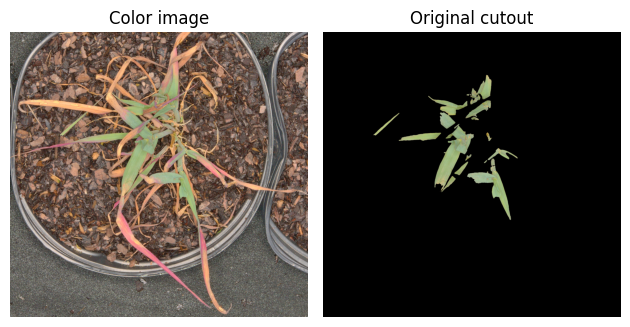

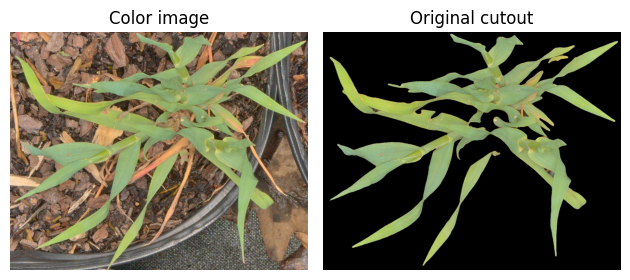

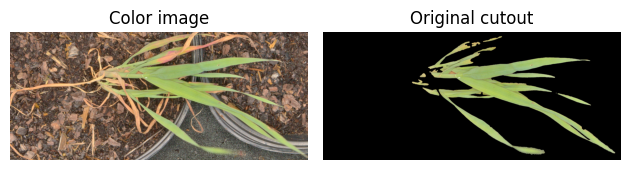

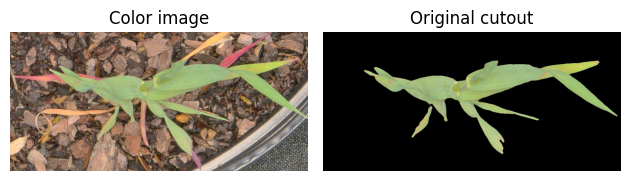

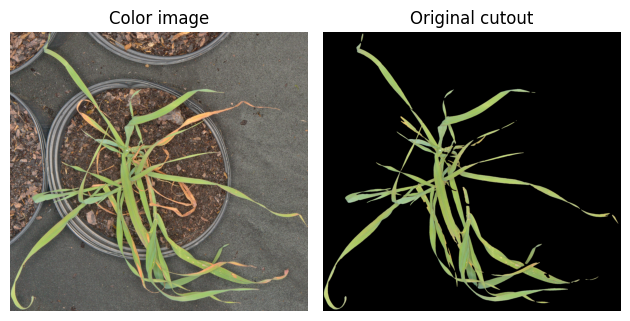

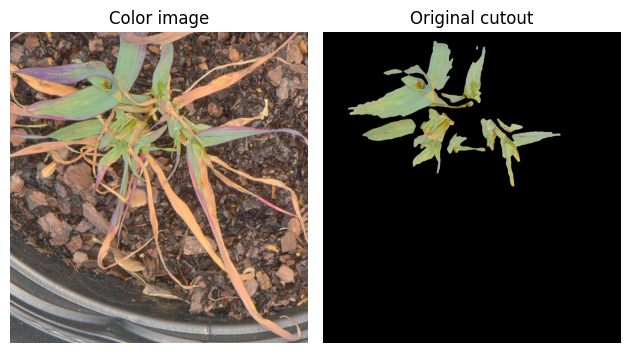

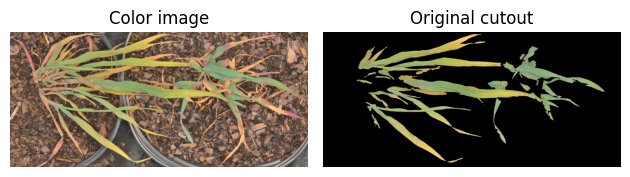

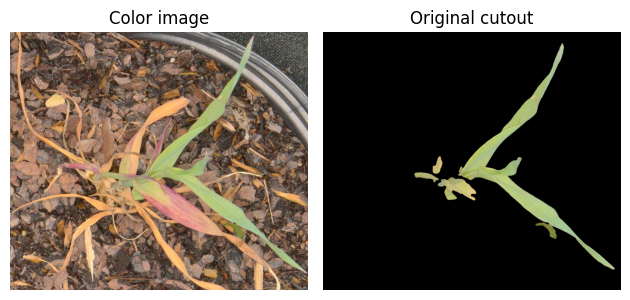

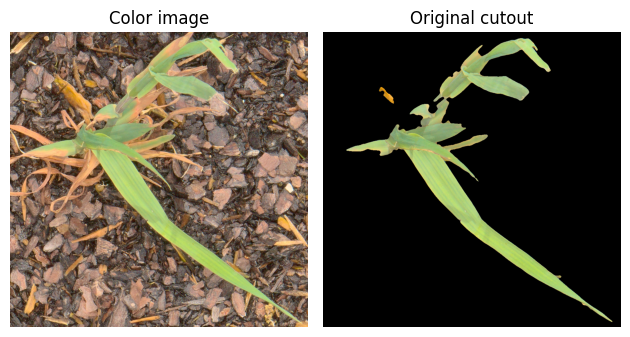

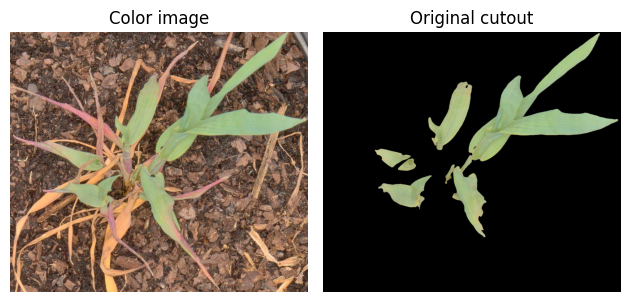

Mustards


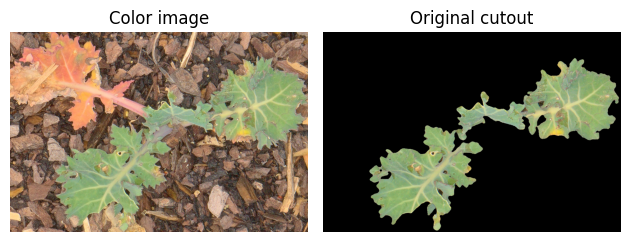

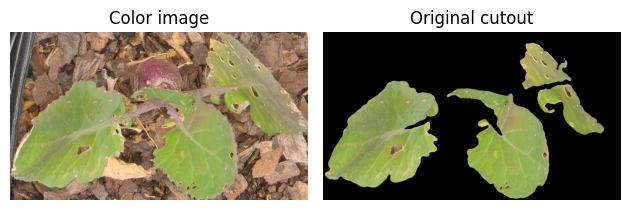

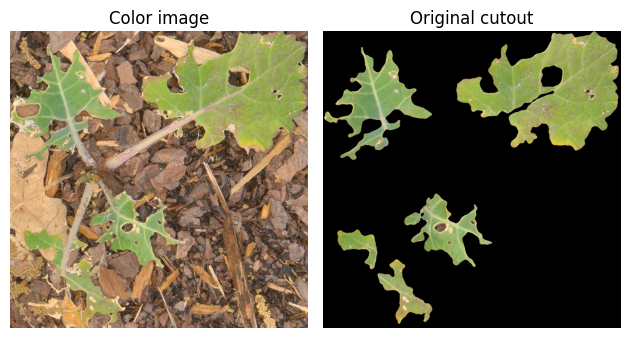

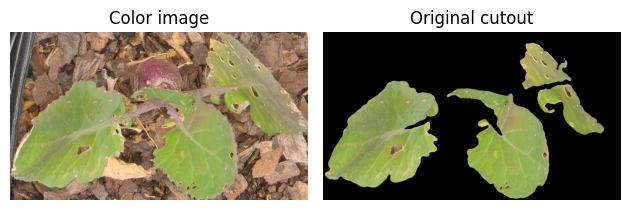

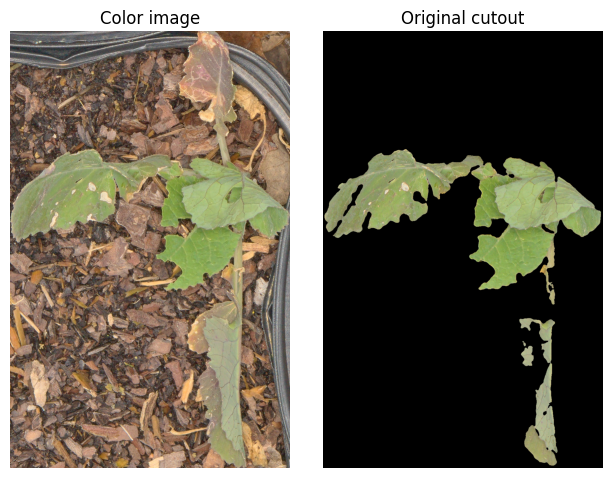

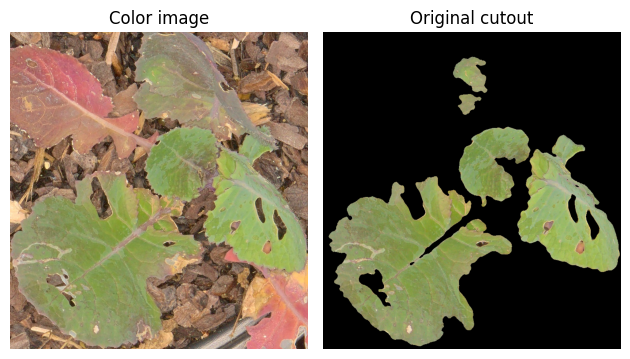

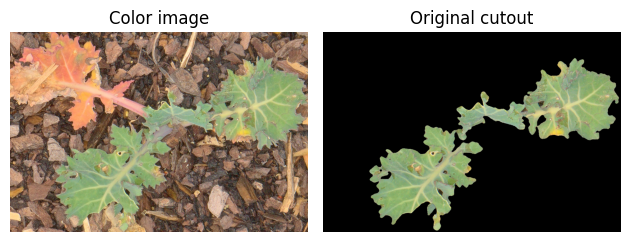

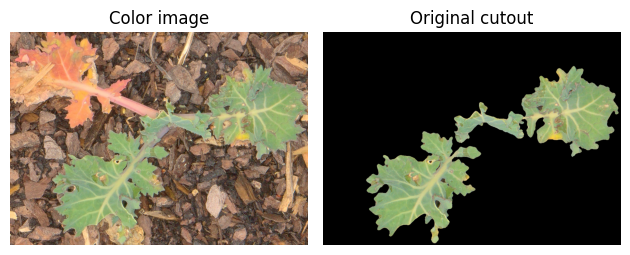

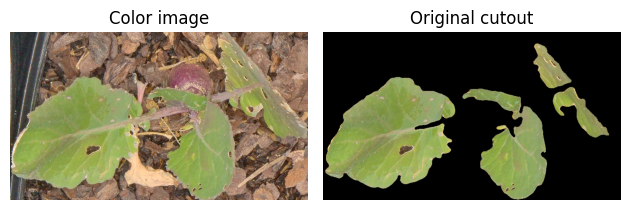

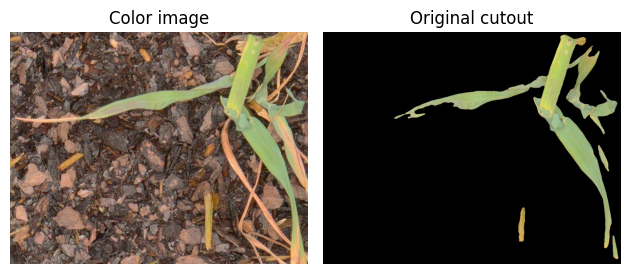

Black oats


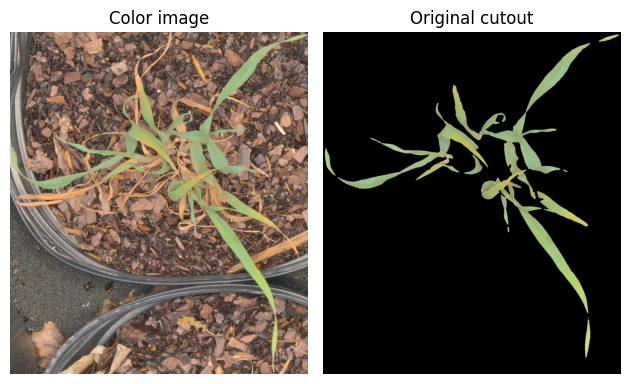

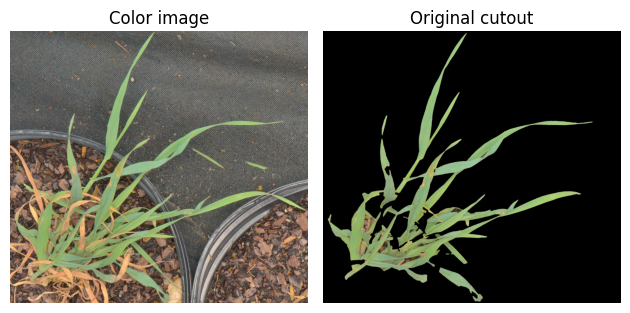

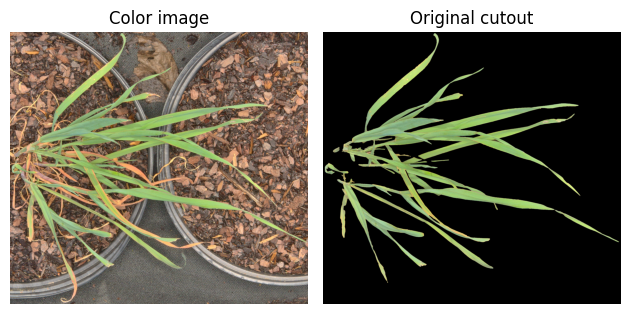

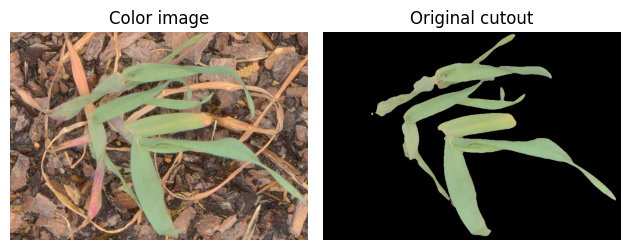

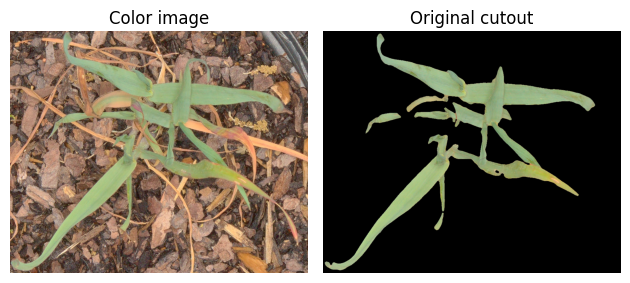

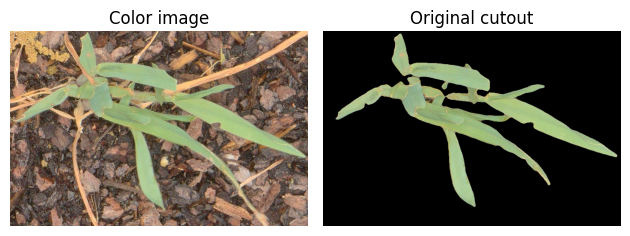

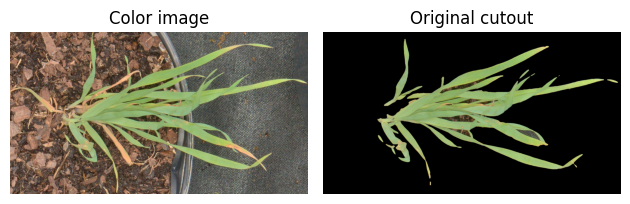

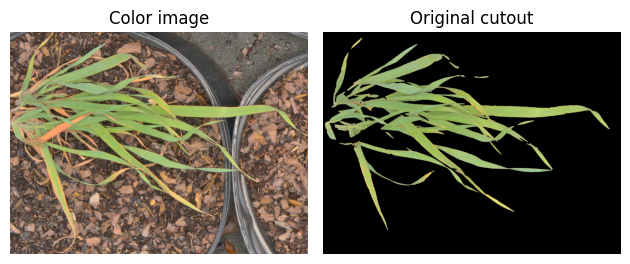

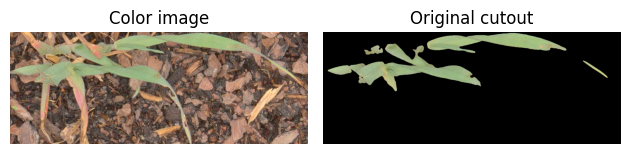

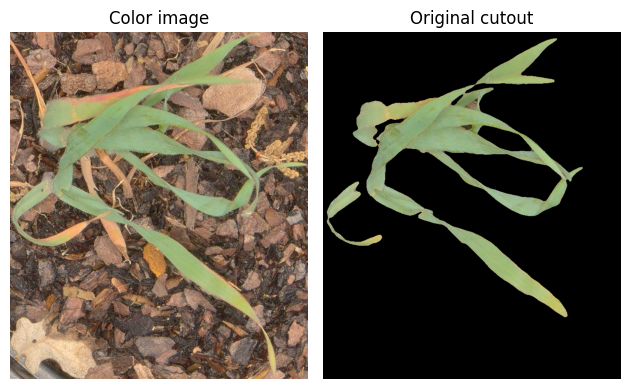

cultivated radish


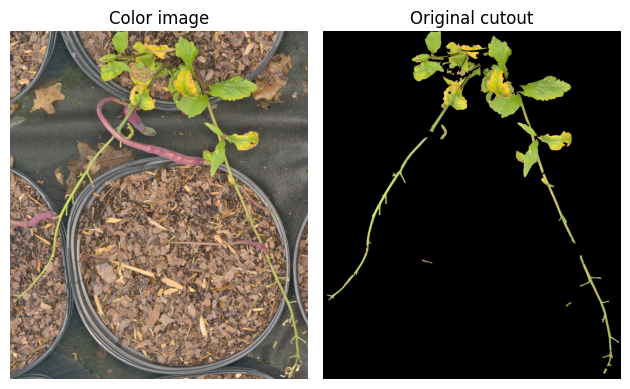

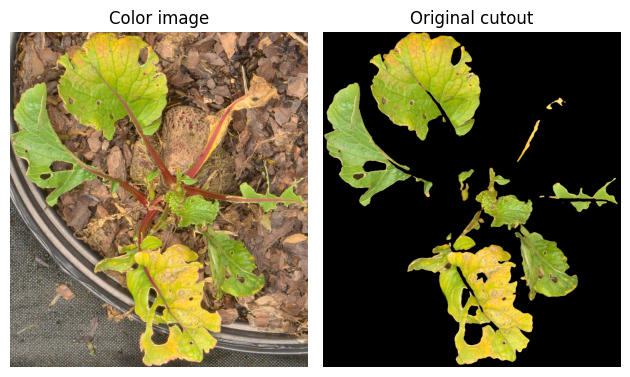

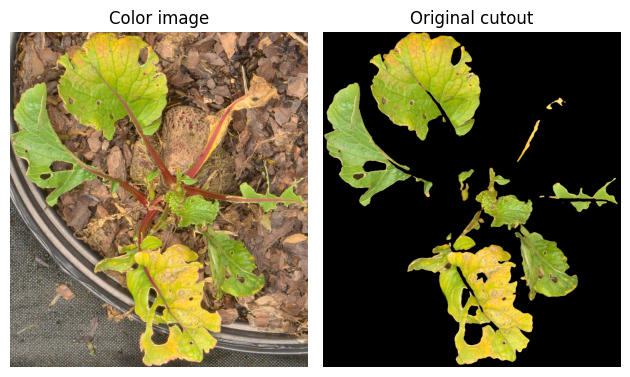

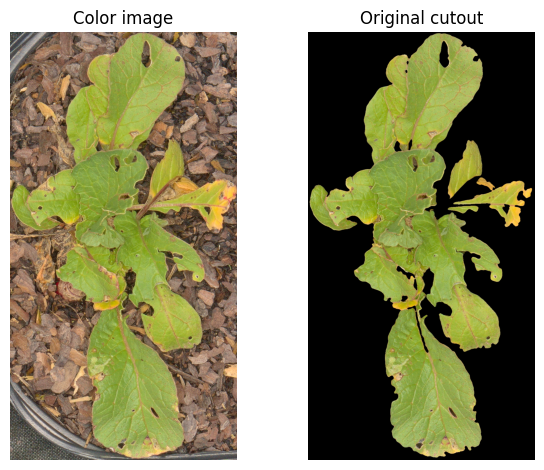

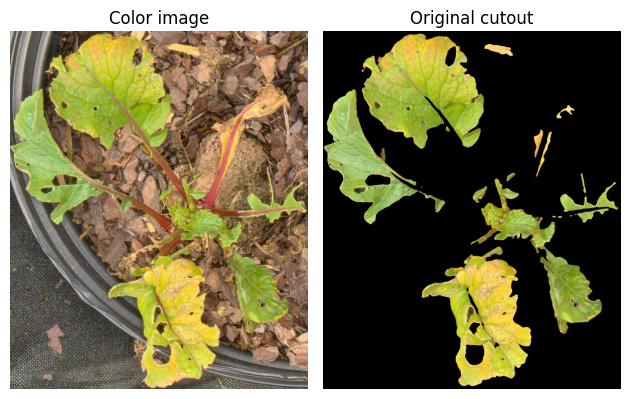

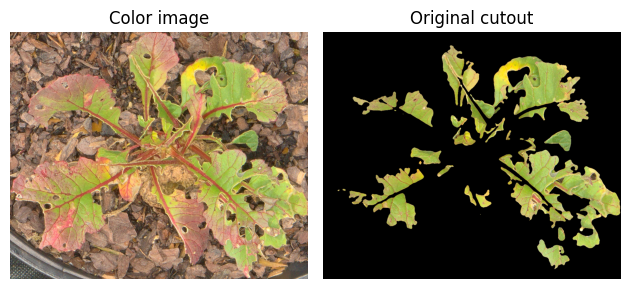

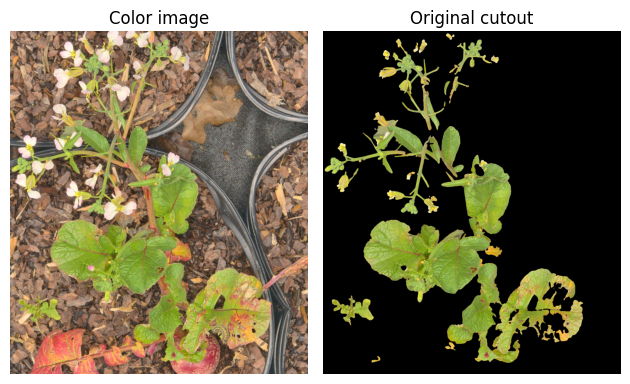

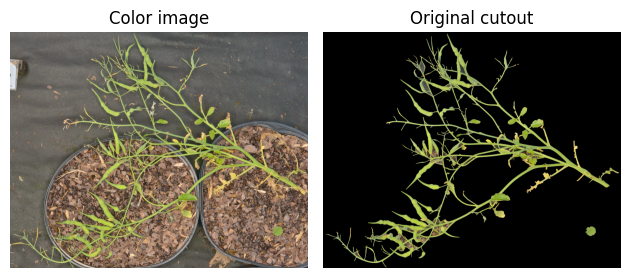

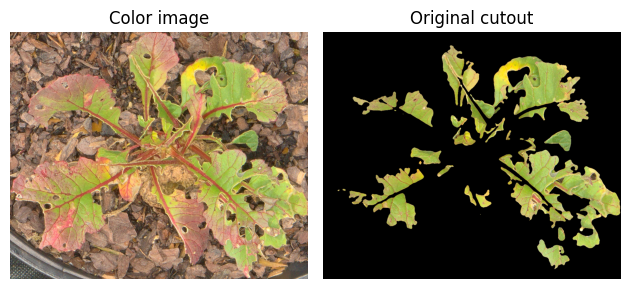

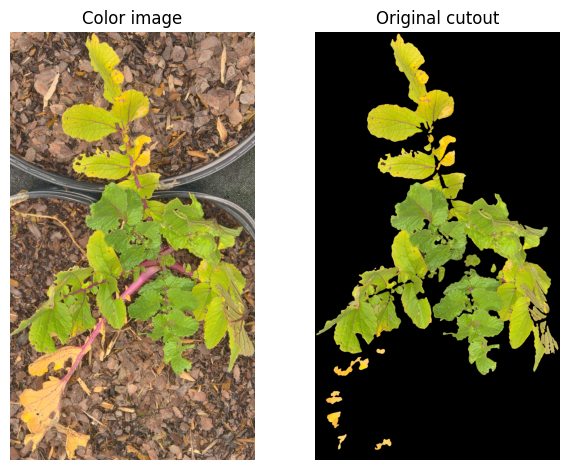

In [24]:
############################################################
# Configs (change these)
number_of_samples = 10
extends_border = False
is_primary = True
green_sum_max = 10000000
green_sum_min = 10000
# percentiles: 25, 50, 75 quartiles, mean, or None
area_min = None
area_max = None
# should be between 0 and 1
solid_max = None
solid_min = None
#number of components
component_min = None
component_max = None

random_sample_state = 42
fig_save_dir = "../assets/confluence_examples_covers"
############################################################

mask = preview_cutout_results(df,batch_id, number_of_samples, extends_border,
                              is_primary, green_sum_max, green_sum_min,
                              area_min, area_max, solid_min, solid_max,
                              component_min, component_max,
                              random_sample_state, fig_save_dir)